In [1]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
import torch
from pathlib import Path

from machine_perception.segment_anything_2.sam2.build_sam import (
    build_sam2_video_predictor,
)
from machine_perception.datasets.MOSE_SAM_dataset import MOSE_SAM_Dataset

In [2]:
if torch.cuda.is_available():
    DEVICE = torch.device("cuda")
elif torch.backends.mps.is_available():
    DEVICE = torch.device("mps")
else:
    DEVICE = torch.device("cpu")

print(f"Using device: {DEVICE}")

Using device: mps


In [3]:
DATA_DIR = Path().resolve().parents[2] / "data"

mose_sam_test_dataset = MOSE_SAM_Dataset(
    root=DATA_DIR / "train",
    meta_file=DATA_DIR / "meta_test_split.json",
)

In [4]:
class SAM2:
    def __init__(self, config: str, checkpoint: str, device: str = "cuda"):
        self.checkpoint_path = checkpoint
        self.device = device
        self.predictor = build_sam2_video_predictor(config, checkpoint, device=device)

    def add_objects_input_annotations(
        self, video_path: str, input_mask: np.ndarray
    ) -> None:
        """
        Adds object annotations to the input mask for a given video frame.

        :param video_path: Path to the video file.
        :param input_mask: Input mask for the video frame.
        :return: Dictionary containing the updated input mask and its corresponding bounding boxes.
        """

        _, bboxes = self._get_bboxes_from_instance_mask(input_mask)
        labels, points = self._get_points_from_instance_mask(input_mask)
        points = np.array(points, dtype=np.float32)
        ann_frame_idx = 0

        for i in range(len(points)):
            ann_obj_id = i + 1
            ann_obj_labels = np.zeros_like(labels)
            ann_obj_labels[i] = 1
            _, object_ids, mask_logits = self.predictor.add_new_points_or_box(
                inference_state=self.inference_state,
                frame_idx=ann_frame_idx,
                obj_id=ann_obj_id,
                points=points,
                labels=ann_obj_labels,
                box=bboxes[i],
            )

    def _propagate_predictions_in_video(self) -> dict:
        """
        Propagates the predictions in the video using the initialized state.

        :return: None
        """
        video_segments = {}  # video_segments contains the per-frame segmentation results
        for (
            out_frame_idx,
            out_obj_ids,
            out_mask_logits,
        ) in self.predictor.propagate_in_video(self.inference_state):
            video_segments[out_frame_idx] = {
                out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
                for i, out_obj_id in enumerate(out_obj_ids)
            }

        return video_segments

    def predict(self, video_path: str, input_mask: np.ndarray) -> dict:
        """
        Predicts the segmentation mask for a given video frame using SAM2.

        :param video_path: Path to the video file.
        :param input_mask: Input mask for the video frame.
        :return: Dictionary containing the predicted masks and their corresponding bounding boxes.
        """

        self.inference_state = self.predictor.init_state(video_path)
        self.add_objects_input_annotations(video_path, input_mask)
        video_segments = self._propagate_predictions_in_video()
        self.predictor.reset_state(self.inference_state)

        return video_segments

    @staticmethod
    def _get_bboxes_from_instance_mask(
        label_img: np.ndarray,
    ) -> tuple[list[int], list[list[int, int, int, int]]]:
        """
        Extract bounding boxes for all object IDs present in the label image.

        :param label_img: Label image with object instance IDs.
        :return: Tuple containing a list of instance IDs and a list of their bounding boxes (x1, y1, x2, y2).
        """
        instance_ids = np.unique(label_img)
        instance_ids = instance_ids[instance_ids != 0]

        bboxes = []
        for instance_id in instance_ids:
            mask = (label_img == instance_id).astype(np.uint8)
            if np.sum(mask) == 0:
                continue
            x, y, w, h = cv2.boundingRect(mask)
            bboxes.append([x, y, x + w, y + h])

        return instance_ids.tolist(), bboxes

    @staticmethod
    def _get_points_from_instance_mask(
        label_img: np.ndarray,
    ) -> tuple[list[int], list[list[int, int]]]:
        """
        Extract representative points (e.g., center of mass) for all object IDs in the label image.

        :param label_img: Label image with object instance IDs.
        :return: Tuple containing a list of instance IDs and a list of their points (x, y).
        """
        instance_ids = np.unique(label_img)
        instance_ids = instance_ids[instance_ids != 0]

        points = []
        for instance_id in instance_ids:
            mask = (label_img == instance_id).astype(np.uint8)
            if np.sum(mask) == 0:
                continue
            # Use moments to find the center of mass
            M = cv2.moments(mask)
            if M["m00"] == 0:
                continue
            cx = int(M["m10"] / M["m00"])
            cy = int(M["m01"] / M["m00"])
            points.append([cx, cy])

        return instance_ids.tolist(), points


In [5]:
sam_test_sample = mose_sam_test_dataset[99]

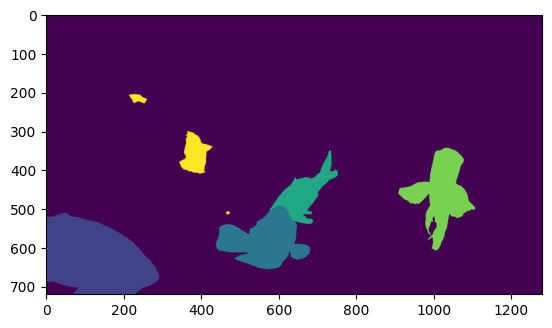

In [6]:
sam_test_sample_path = sam_test_sample["images_path"]
label = sam_test_sample["video_frames"][0]["label"]

plt.imshow(label)

In [7]:
CHECKPOINT = Path().resolve() / "sam2" / "sam2.1_hiera_large.pt"
CONFIG = "sam2.1_hiera_l.yaml"

sam2_model = SAM2(
    config=CONFIG,
    checkpoint=CHECKPOINT,
    device=DEVICE
)

In [8]:
sam2_model_prediction = sam2_model.predict(
    video_path=sam_test_sample_path,
    input_mask=label
)

frame loading (JPEG): 100%|██████████| 66/66 [00:01<00:00, 44.85it/s]
/Users/andrejkartavik/Desktop/university/master/semester1/MP/machine-perception/src/machine_perception/segment_anything_2/sam2/sam2_video_predictor.py:786: UserWarning: cannot import name '_C' from 'sam2' (/Users/andrejkartavik/Desktop/university/master/semester1/MP/machine-perception/src/machine_perception/experiments/sam2/__init__.py)

Skipping the post-processing step due to the error above. You can still use SAM 2 and it's OK to ignore the error above, although some post-processing functionality may be limited (which doesn't affect the results in most cases; see https://github.com/facebookresearch/sam2/blob/main/INSTALL.md).
  pred_masks_gpu = fill_holes_in_mask_scores(
propagate in video: 100%|██████████| 66/66 [02:30<00:00,  2.28s/it]


/var/folders/19/6fxk39qn5xq4llhgjf6z4tl00000gn/T/ipykernel_8777/2583493954.py:16: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap("Set1", num_instances)


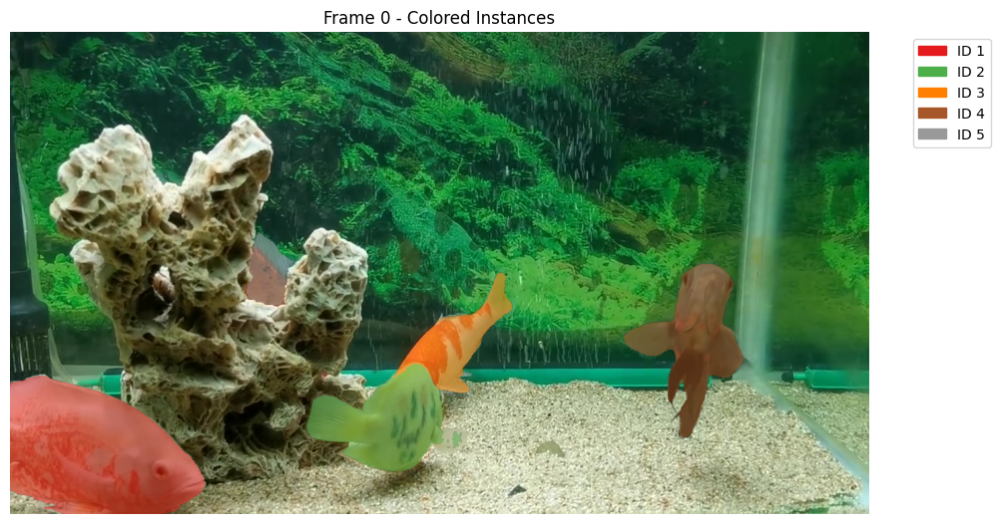

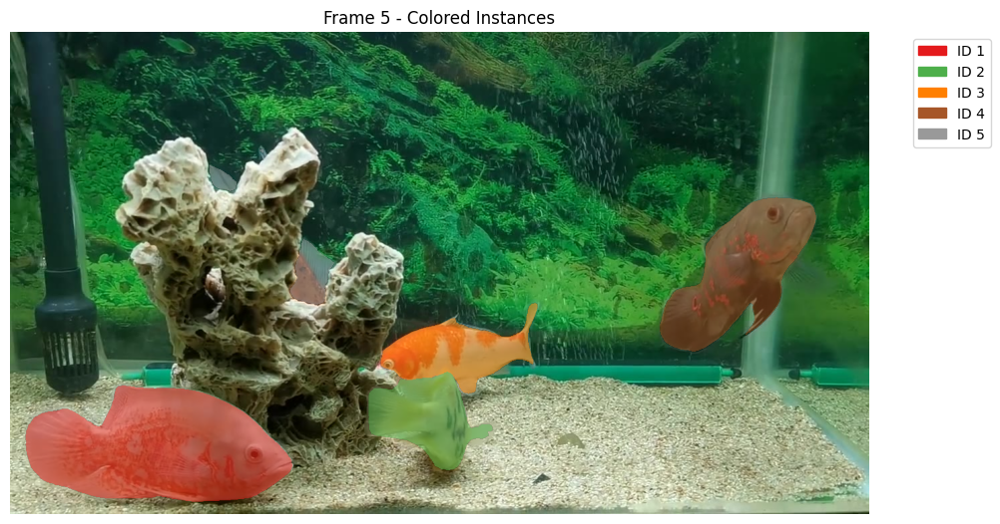

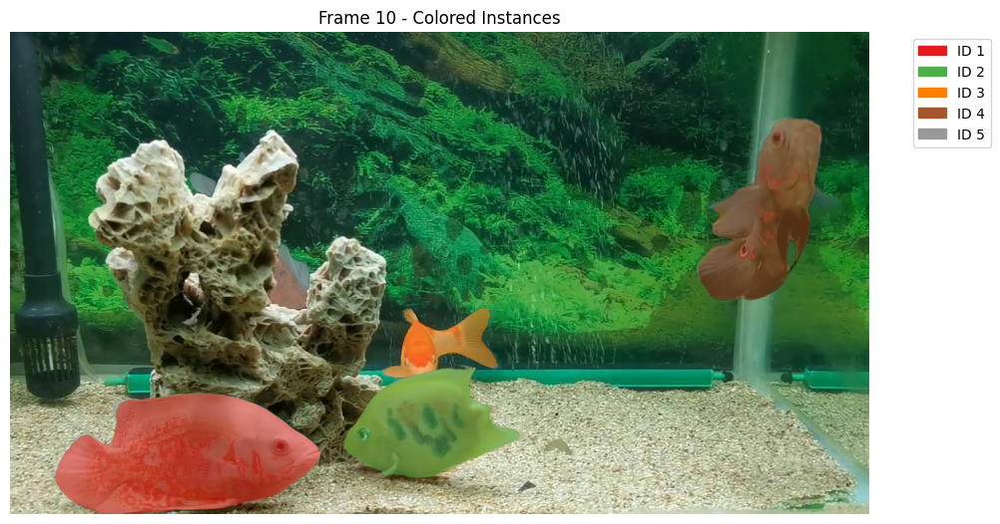

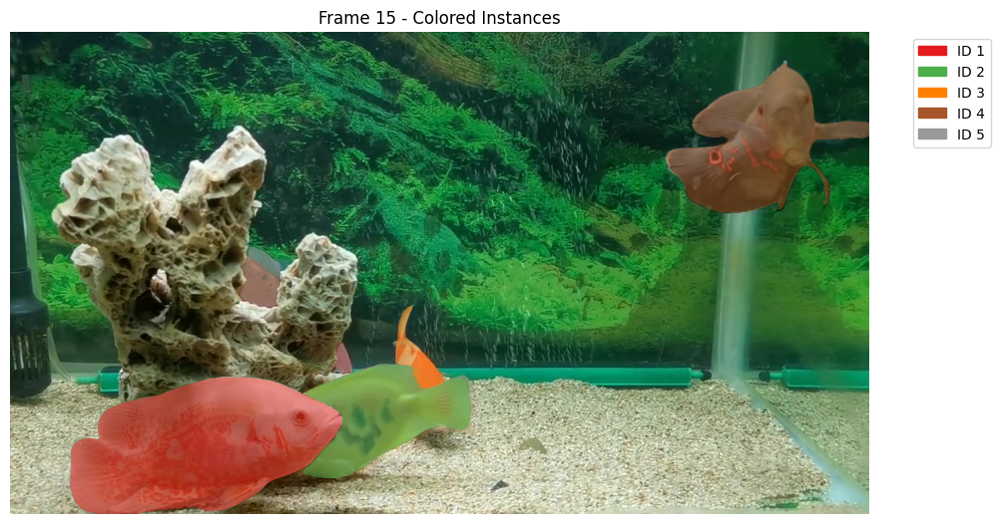

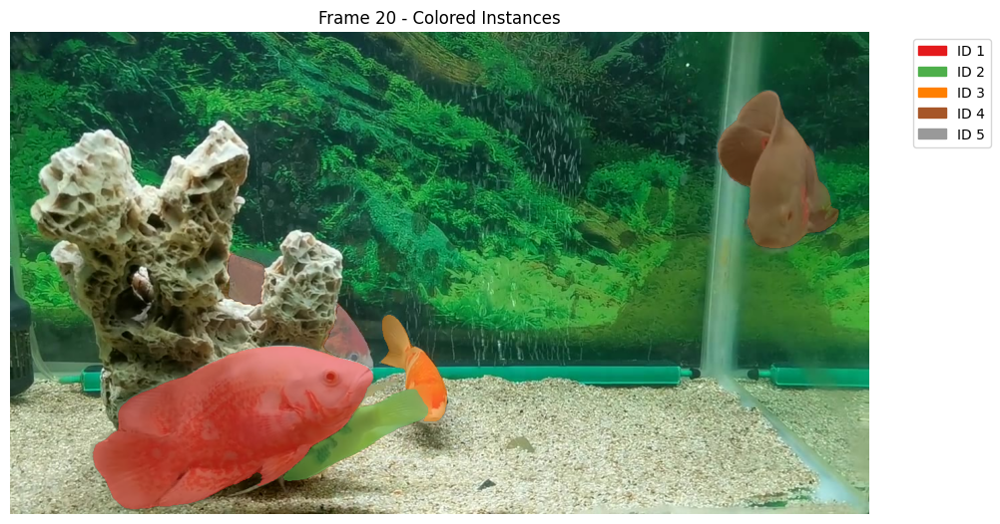

...

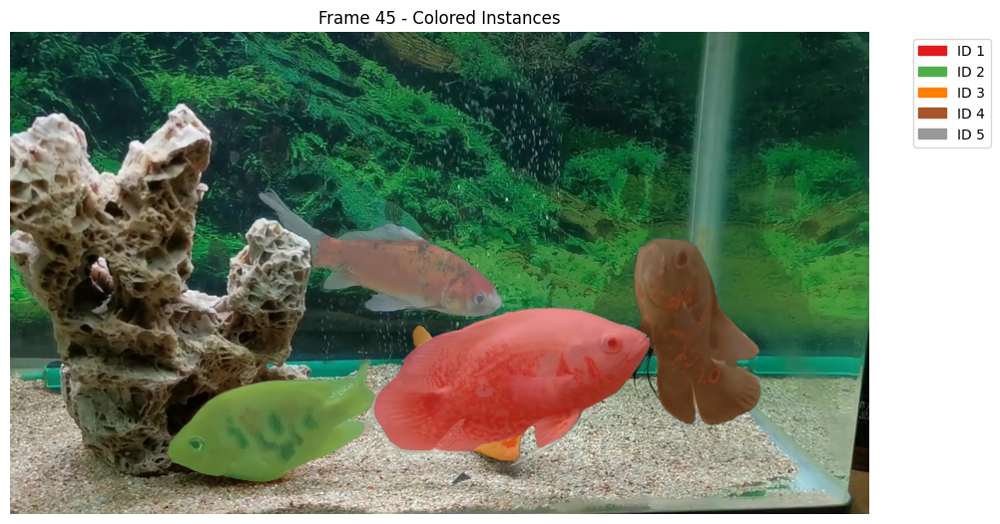

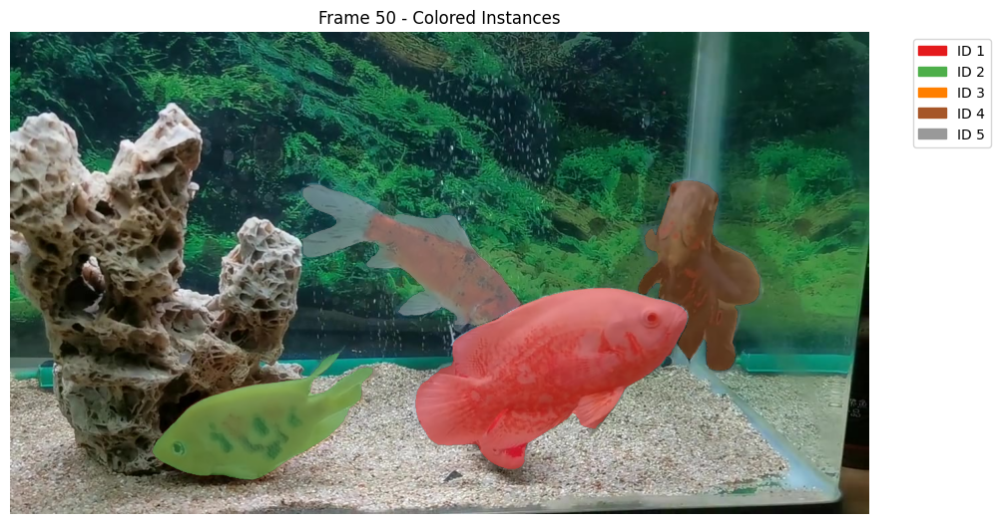

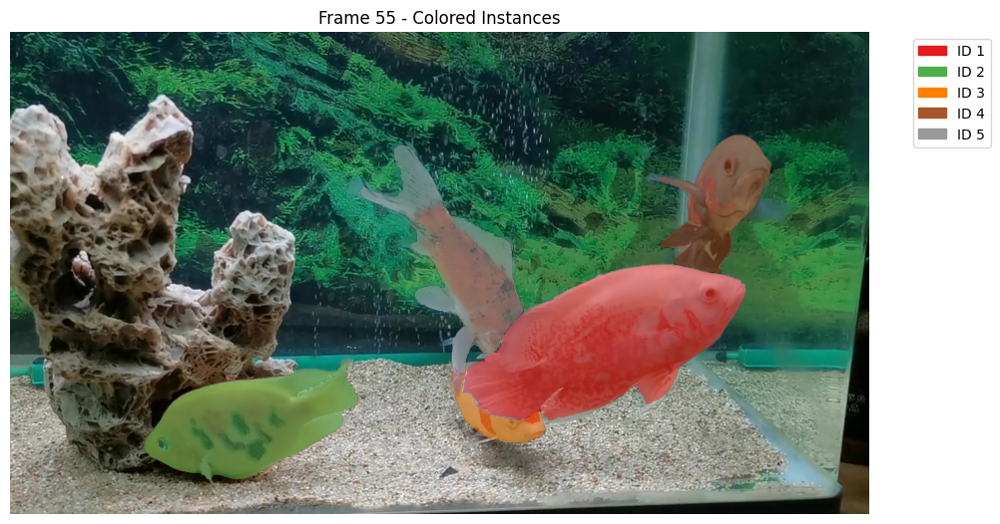

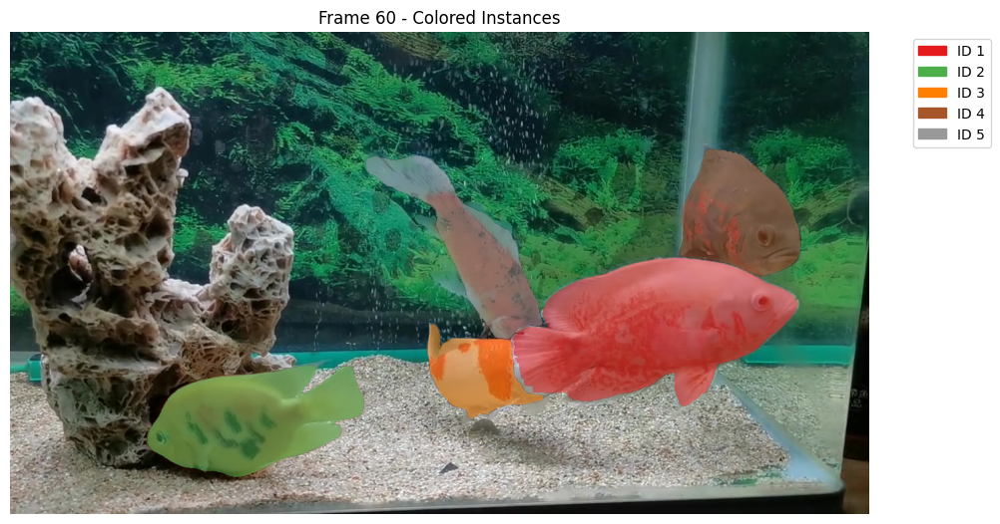

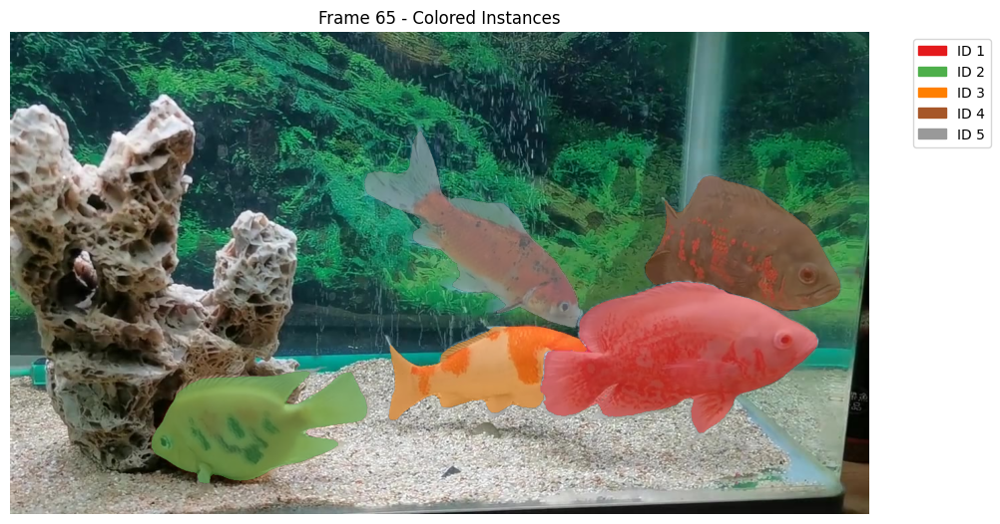

In [9]:
import matplotlib.patches as mpatches


video_frames = sam_test_sample["video_frames"]

for frame_id in range(0, len(video_frames), 5):
    image = video_frames[frame_id]["image"]
    instance_masks = sam2_model_prediction[frame_id]
    height, width = image.shape[:2]

    # Initialize RGBA overlay
    overlay = np.zeros((height, width, 4), dtype=np.float32)

    # Generate distinct colors for each object (tab20 colormap)
    num_instances = len(instance_masks)
    cmap = plt.cm.get_cmap("Set1", num_instances)
    legend_patches = []

    for idx, (instance_id, mask) in enumerate(instance_masks.items()):
        color = cmap(idx)  # RGBA tuple
        single_mask = mask[0]  # (H, W)

        # Apply color to mask area
        overlay[single_mask] = color[:3] + (0.5,)  # RGB + alpha = 0.5
        legend_patches.append(mpatches.Patch(color=color, label=f'ID {instance_id}'))

    # Plot image with transparent overlays
    plt.figure(figsize=(10, 6))
    plt.imshow(image)
    plt.imshow(overlay)
    plt.title(f"Frame {frame_id} - Colored Instances")
    plt.axis("off")
    plt.legend(handles=legend_patches, loc='upper right', bbox_to_anchor=(1.15, 1))
    plt.tight_layout()
    plt.show()